In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import random
import lightgbm as lgb
from sklearn.model_selection import KFold
from imblearn.metrics import  geometric_mean_score
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score, f1_score, precision_recall_curve, precision_score 
from sklearn.metrics import recall_score, average_precision_score, auc
from sklearn.ensemble import RandomForestClassifier
from imblearn.under_sampling import NearMiss, RandomUnderSampler
from imblearn.over_sampling import SMOTE, ADASYN

In [2]:
liver_df = pd.read_csv('C:/Users/kanka/OneDrive/Desktop/Final Project/Datasets/IndianLiverPatient.csv',  delimiter=',')

liver_df


,65,Female,0.7,0.1,187,16,18,6.8,3.3,0.9,1
0,62,Male,10.9,5.5,699,64,100,7.5,3.2,0.74,1
1,62,Male,7.3,4.1,490,60,68,7.0,3.3,0.89,1
2,58,Male,1.0,0.4,182,14,20,6.8,3.4,1.00,1
3,72,Male,3.9,2.0,195,27,59,7.3,2.4,0.40,1
4,46,Male,1.8,0.7,208,19,14,7.6,4.4,1.30,1
...,...,...,...,...,...,...,...,...,...,...,...
577,60,Male,0.5,0.1,500,20,34,5.9,1.6,0.37,2
578,40,Male,0.6,0.1,98,35,31,6.0,3.2,1.10,1
579,52,Male,0.8,0.2,245,48,49,6.4,3.2,1.00,1
580,31,Male,1.3,0.5,184,29,32,6.8,3.4,1.00,1


In [3]:
liver_df.columns = ['Age', 'Gender', 'Total Bilirubin', 'Direct Bilirubin', 
                   'Alkaline Phosphotase', 'Alamine Aminotransferase', 'Aspartate Aminotransferase', 'Total Protiens', 'Albumin','A/G Ratio Albumin and Globulin', 'Class']

In [4]:
liver_df

,Age,Gender,Total Bilirubin,Direct Bilirubin,Alkaline Phosphotase,Alamine Aminotransferase,Aspartate Aminotransferase,Total Protiens,Albumin,A/G Ratio Albumin and Globulin,Class
0,62,Male,10.9,5.5,699,64,100,7.5,3.2,0.74,1
1,62,Male,7.3,4.1,490,60,68,7.0,3.3,0.89,1
2,58,Male,1.0,0.4,182,14,20,6.8,3.4,1.00,1
3,72,Male,3.9,2.0,195,27,59,7.3,2.4,0.40,1
4,46,Male,1.8,0.7,208,19,14,7.6,4.4,1.30,1
...,...,...,...,...,...,...,...,...,...,...,...
577,60,Male,0.5,0.1,500,20,34,5.9,1.6,0.37,2
578,40,Male,0.6,0.1,98,35,31,6.0,3.2,1.10,1
579,52,Male,0.8,0.2,245,48,49,6.4,3.2,1.00,1
580,31,Male,1.3,0.5,184,29,32,6.8,3.4,1.00,1


In [5]:
liver_df.dtypes

Age                                 int64
Gender                             object
Total Bilirubin                   float64
Direct Bilirubin                  float64
Alkaline Phosphotase                int64
Alamine Aminotransferase            int64
Aspartate Aminotransferase          int64
Total Protiens                    float64
Albumin                           float64
A/G Ratio Albumin and Globulin    float64
Class                               int64
dtype: object

In [6]:
liver_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 582 entries, 0 to 581
Data columns (total 11 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Age                             582 non-null    int64  
 1   Gender                          582 non-null    object 
 2   Total Bilirubin                 582 non-null    float64
 3   Direct Bilirubin                582 non-null    float64
 4   Alkaline Phosphotase            582 non-null    int64  
 5   Alamine Aminotransferase        582 non-null    int64  
 6   Aspartate Aminotransferase      582 non-null    int64  
 7   Total Protiens                  582 non-null    float64
 8   Albumin                         582 non-null    float64
 9   A/G Ratio Albumin and Globulin  578 non-null    float64
 10  Class                           582 non-null    int64  
dtypes: float64(5), int64(5), object(1)
memory usage: 50.1+ KB


Age                               0
Gender                            0
Total Bilirubin                   0
Direct Bilirubin                  0
Alkaline Phosphotase              0
Alamine Aminotransferase          0
Aspartate Aminotransferase        0
Total Protiens                    0
Albumin                           0
A/G Ratio Albumin and Globulin    4
Class                             0
dtype: int64


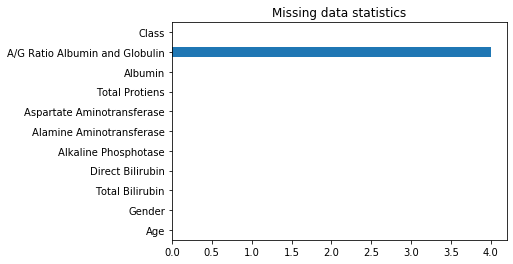

In [7]:
c = liver_df.isnull().sum()
plt.title("Missing data statistics")
c.plot(kind='barh')
print(c)

In [8]:
liver_df = liver_df.dropna() 

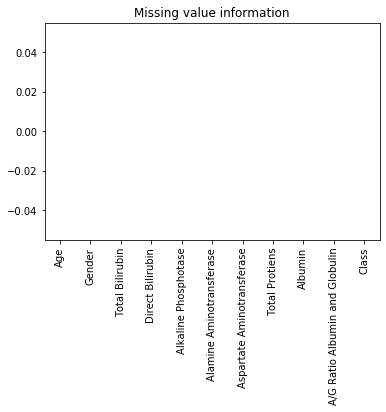

In [9]:
#*********Checking for missing values*****************
Missingvalue_stats = liver_df.isnull().sum()
plt.title("Missing value information")
Missingvalue_stats.plot(kind='bar') #Bar chart to plot count of missing values

Count of Liver patients 413
Count of Non-Liver patients 165


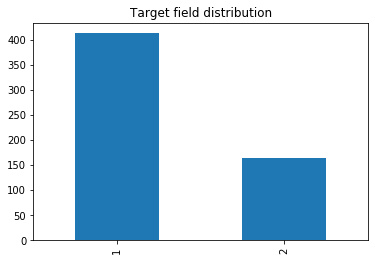

In [10]:
patient, non_patient = liver_df['Class'].value_counts()
print('Count of Liver patients', patient)
print('Count of Non-Liver patients', non_patient)
liver_df['Class'].value_counts().plot(kind='bar', title='Target field distribution')
plt.show()

In [11]:
replace = {"Class":     {2: 0}}
liver_df = liver_df.replace(replace)
liver_df.head()

,Age,Gender,Total Bilirubin,Direct Bilirubin,Alkaline Phosphotase,Alamine Aminotransferase,Aspartate Aminotransferase,Total Protiens,Albumin,A/G Ratio Albumin and Globulin,Class
0,62,Male,10.9,5.5,699,64,100,7.5,3.2,0.74,1
1,62,Male,7.3,4.1,490,60,68,7.0,3.3,0.89,1
2,58,Male,1.0,0.4,182,14,20,6.8,3.4,1.00,1
3,72,Male,3.9,2.0,195,27,59,7.3,2.4,0.40,1
4,46,Male,1.8,0.7,208,19,14,7.6,4.4,1.30,1


Count of Liver patients 413
Count of Non-Liver patients 165


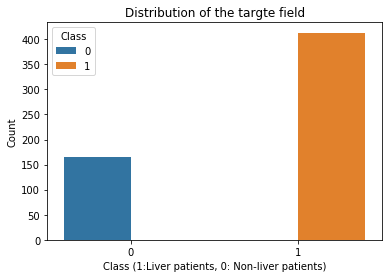

In [12]:
patient, non_patient = liver_df['Class'].value_counts()
print('Count of Liver patients', patient)
print('Count of Non-Liver patients', non_patient)
sns.countplot(x="Class", hue="Class", data=liver_df)
plt.ylabel('Count')
plt.xlabel('Class (1:Liver patients, 0: Non-liver patients)')
plt.title('Distribution of the targte field')
plt.show()


In [13]:
encoded_liver_df = pd.get_dummies(liver_df, columns=["Gender"])

encoded_liver_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 578 entries, 0 to 581
Data columns (total 12 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Age                             578 non-null    int64  
 1   Total Bilirubin                 578 non-null    float64
 2   Direct Bilirubin                578 non-null    float64
 3   Alkaline Phosphotase            578 non-null    int64  
 4   Alamine Aminotransferase        578 non-null    int64  
 5   Aspartate Aminotransferase      578 non-null    int64  
 6   Total Protiens                  578 non-null    float64
 7   Albumin                         578 non-null    float64
 8   A/G Ratio Albumin and Globulin  578 non-null    float64
 9   Class                           578 non-null    int64  
 10  Gender_Female                   578 non-null    uint8  
 11  Gender_Male                     578 non-null    uint8  
dtypes: float64(5), int64(5), uint8(2)
me

In [14]:
x= encoded_liver_df.drop(['Class'], axis=1)
x
y = encoded_liver_df['Class']
print(x.shape[1])



11


# AIS Algorithm functions

In [15]:
def initilization_of_population_featurebased(size,n_feat):
    population = []
    #chromosome = []
    for j in range(size): 
        chromosome = []    #chromosome type is list
        for i in range(n_feat):
            if i == 0:
                gene = random.randint(4, 65)
            elif i == 1:
                gene = round(random.uniform(0.5, 2))
            elif i == 2:
                gene = round(random.uniform(0.1, 1))
            elif i == 3:
                gene =  random.randint(100, 630)
            elif i == 4:
                gene =  random.randint(12, 119)
            elif i == 5:
                gene =  random.randint(12, 234)
            elif i == 6:
                gene = round(random.uniform(3.9, 8))
            elif i ==7:
                gene = round(random.uniform(1.6, 4))
            elif i ==8:
                gene = round(random.uniform(0.5, 1.3))
            elif i == 9:
                gene = 0
            else:
                gene = 1
            chromosome.append(gene)
        population.append(chromosome)
    return(population)

In [16]:
def fitness_score(population,model,X_train,X_test, y_train, y_test):
    scores = []
    for chromosome in population:
        a_series = pd.Series(chromosome, index = X_train.columns)
        b_series = pd.Series([0])
        X_train_with_chromosome = X_train.append(a_series, ignore_index=True)
        y_train_with_chromosome = y_train.append(b_series, ignore_index=True)
        model.fit(X_train_with_chromosome,np.ravel(y_train_with_chromosome))
        predictions = model.predict(X_test)
        scores.append(f1_score(np.ravel(y_test), predictions))
    scores, population = np.array(scores), np.array(population) # list of arrays scores = [[array1],[array2]]
    inds = np.argsort(scores) #[2, 3, 1, 0] indicates that the smallest element is at index 2, the next smallest at index 3, then index 1, then index 0.
    return list(scores[inds][::-1]), list(population[inds,:][::-1]) #list of list (converting each array such as array, array2  0 to list in sorted order)

In [17]:
def selection(pop_after_fit,n_parents):
    population_nextgen = [] #New array 
    for i in range(n_parents): 
        population_nextgen.append(pop_after_fit[i])  # append the best chromosomes as parents from results after fit function
    return population_nextgen 

In [18]:
def clone(pop_after_sel, clone_rate):
    population_next_gen_cloned = []
    population_next_gen=pop_after_sel
    for x in range(clone_rate):
            for i in range(len(population_next_gen)):
                clones = population_next_gen[i]
                population_next_gen_cloned.append(clones)
    return population_next_gen_cloned
    

In [19]:
def mutation_clone(pop_after_clone,mutation_rate):
    population_nextgen = []
    for i in range(0,len(pop_after_clone)):  #consider each chromoseome from the cross over set
        chromosome = pop_after_clone[i]  #take in sequence one after other chromosomes
        for j in range(len(chromosome)):  #with the one chromosome array
            if j == 0:  #Up to us can be anything here we see if randomly generated value < mutate
                chromosome[j] = int(chromosome[j] + (mutation_rate * 10))
            elif j== 1:
                chromosome[j] = round(float(chromosome[j] + (mutation_rate * 0.1)))
            elif j== 2:
                chromosome[j] = round(float(chromosome[j] + (mutation_rate * 0.5)))
            elif j== 3:
                chromosome[j] = int(chromosome[j] + (mutation_rate * 5))
            elif j== 4:
                chromosome[j] = int(chromosome[j] + (mutation_rate * 5))
            elif j== 5:
                chromosome[j] = int(chromosome[j] + (mutation_rate * 10))
            elif j== 6:
                chromosome[j] = round(float(chromosome[j] + (mutation_rate * 0.1)))
            elif j== 7:
                chromosome[j] = round(float(chromosome[j] + (mutation_rate * 0.1)))
            elif j== 8:
                chromosome[j] = round(float(chromosome[j] + (mutation_rate * 0.2)))
            elif j== 9:
                chromosome[j] = 0
            else:
                chromosome[j] = 1
        population_nextgen.append(chromosome)  #append all the changed ones to next_gen
    
    return population_nextgen

t1 = mutation_clone(t,0.1)

print(t1)

In [20]:
def generations(size,n_feat,n_parents,mutation_rate, clone_rate,model,X_train,X_test, y_train, y_test):
    best_chromo= []
    best_score= []
    stop_condition = True
    i = 0
    fscore_counter = 0
    bestscore_counter = 0
    population_nextgen=initilization_of_population_featurebased(size,n_feat)
    print('Initial random population based on minority class features')
    print(population_nextgen)
    while stop_condition:
        print(i)
        print('--------------------------------------------------------------------------')
        scores, pop_after_fit = fitness_score(population_nextgen, model,X_train,X_test, y_train, y_test)
        print('Scores of each chromosomes in sorted order')
        print(scores)
        print('Chromosome set sorted and corresponding to scores')
        print(pop_after_fit)
        pop_after_sel = selection(pop_after_fit,n_parents)
        print('Selects the best parents to generate better chromosomes for next generation')
        print(pop_after_sel)
        print("Clone after selection based on clone_rate")
        pop_after_clone = clone(pop_after_sel, clone_rate)
        print(pop_after_clone)
        print('Mutate the cloned population')
        population_nextgen = mutation_clone(pop_after_clone,mutation_rate)
        print(population_nextgen)
        if i > 0:
             if round(best_score[-1],5) >= round(scores[0],5):
                    print("Checking if the values are degrading or equal")
                    fscore_counter = fscore_counter + 1
                    print(fscore_counter)
                    if fscore_counter == 10 :
                        print("&&&&&&&&&--------Fscore_counter is checked and near to 10--------&&&&&&&&&&&&&")
                        stop_condition = False
                        
             elif stop_condition == True:
                if round(best_score[-1],5) < round(scores[0],5):
                    print("&&&&&&&&&&&&&&-----Fscore_counter is recompiled to O-------&&&&&&&&&&&&&&&&&")
                    fscore_counter = 0
             if stop_condition == True:
                if len(best_score) > 150:
                    print("-----Length of best score is exceeded so stopping the AIS now--------")
                    stop_condition = False
             #else:
               # stop_condition = True
                    
        i = i + 1
        
        best_chromo.append(pop_after_fit[0])
        best_score.append(scores[0])
        print('best score and chromosome')
        print(best_chromo)
        print(best_score)
        
    return best_chromo, best_score

In [21]:
def update_AIS_GeneratedSample_in_TrainSet(chromo,Initial_X_train,Initial_y_train):
    X_train = Initial_X_train
    y_train = Initial_y_train
    for best_chromo in chromo:
        X_train_bestchromo = []
        a_series = pd.Series(best_chromo, index = X_train.columns)
        b_series = pd.Series([0])
        X_train_bestchromo = X_train.append(a_series, ignore_index=True)
        X_train = X_train_bestchromo
        y_train_bestchromo = y_train.append(b_series, ignore_index=True)
        y_train = y_train_bestchromo
    return X_train, y_train

In [22]:
def modelling_using_AIS_SampledTrainset(AIS_X_train, AIS_y_train, AIS_X_test, AIS_y_test,classifier):
    model = classifier
    model.fit(AIS_X_train,np.ravel(AIS_y_train))
    predictions = model.predict(AIS_X_test)
    acc, recal, precis, aucroc, gmean, _val = evaluation(predictions, AIS_y_test)
    
    return acc, recal, precis, aucroc, gmean, _val
    
    

In [23]:
def evaluation(pred_values, y_test):
    
    acc = accuracy_score(np.ravel(y_test), pred_values)
    recal = recall_score(np.ravel(y_test), pred_values)
    precis = precision_score(np.ravel(y_test), pred_values)
    #val = f1_score(y_test, pred_values)
    aucroc = roc_auc_score(np.ravel(y_test), pred_values)
    _val = f1_score(np.ravel(y_test), pred_values)
    gmean = geometric_mean_score(np.ravel(y_test), pred_values)
    
    return acc, recal, precis, aucroc, gmean, _val

# AIS algorithm on Train and Test datasets function

In [24]:
def AIS_sampling_and_modelling(x,y,model,size,n_feat,n_parents,mutation_rate,clone_rate,foldvalue):
    kf = KFold(n_splits=foldvalue, shuffle = True, random_state=1)
    k = foldvalue
    acc_score = []
    recal_score = []
    pres_score = []
    _fscore = []
    aucroc_score = []
    gmean_score = []
    classifier = model
    for train_index , test_index in kf.split(x):
        print('--------------------------*****START OF FOLD*******--------------------------------------')
        X_train , X_test = x.iloc[train_index,:],x.iloc[test_index,:]
        y_train , y_test = y.iloc[train_index] , y.iloc[test_index]
        Initial_X_train = X_train
        Initial_y_train = y_train
        print('Population generation using {0} Classifier'.format(model))
        print('------------------******AIS STARTED****---------------------------------------------')
        chromo,score=generations(size=size,n_feat=n_feat,n_parents=n_parents,mutation_rate=mutation_rate,clone_rate=clone_rate,
                     model = model,X_train=X_train,y_train=y_train,X_test=X_test,y_test=y_test)
        print('-----------------------***AIS ENDED****---------------------------------------------')
        X_train_AISsampled, y_train_AISsampled = update_AIS_GeneratedSample_in_TrainSet(chromo,Initial_X_train,Initial_y_train)
        print('-------------------******METRICS CALCULATION FOR THIS FOLD STARTED*****--------------')
        acc, recal, precis, aucroc, gmean, _val = modelling_using_AIS_SampledTrainset(X_train_AISsampled, y_train_AISsampled, X_test, y_test, classifier)
        acc_score.append(acc)
        recal_score.append(recal)
        pres_score.append(precis)
        _fscore.append(_val)
        aucroc_score.append(aucroc)
        gmean_score.append(gmean)
        print('-------------*******CALCULATED METRICS FOR THIS FOLD***--------------')
        print('-----------------------****END OF FOLD*****------------------------------------------------')                  
    avg_acc_score = sum(acc_score)/k
    avg_recal_score = sum(recal_score)/k
    avg_precis_score = sum(pres_score)/k
    avg_f_score = sum(_fscore)/k
    avg_auc_score = sum(aucroc_score)/k
    avg_gmean_score = sum(gmean_score)/k
    print('Metrics for each fold of {0} using AIS algorithm'.format(classifier))
    print('Accuracy : {0}'.format(acc_score))
    print('Avg accuracy : {}'.format(avg_acc_score))
    print('Recall : {0}'.format(recal_score))
    print('Avg recall : {}'.format(avg_recal_score))
    print('Precision : {0}'.format(pres_score))
    print('Avg precision : {}'.format(avg_precis_score))
    print('F1_score : {0}'.format(_fscore))
    print('Avg f-score : {}'.format(avg_f_score))
    print('AUC_ROC : {0}'.format(aucroc_score))
    print('Avg AUC_ROC : {}'.format(avg_auc_score))
    print('Geometric mean : {0}'.format(gmean_score))
    print('Avg gmean : {}'.format(avg_gmean_score))
        

In [25]:
def AIS_with_resampling(x,y,model,sampler,size,n_feat,n_parents,mutation_rate,clone_rate,foldvalue):
    kf = KFold(n_splits=foldvalue, shuffle = True, random_state=1)
    k = foldvalue
    acc_score = []
    recal_score = []
    pres_score = []
    _fscore = []
    aucroc_score = []
    gmean_score = []
    classifier = model
    sampleclassifier = sampler
    for train_index , test_index in kf.split(x):
        print('--------------------------*****START OF FOLD*******--------------------------------------')
        X_train , X_test = x.iloc[train_index,:],x.iloc[test_index,:]
        y_train , y_test = y.iloc[train_index] , y.iloc[test_index]
        Initial_X_train = X_train
        Initial_y_train = y_train
        print('Population generation using {0} Classifier'.format(model))
        print('------------------******AIS STARTED****---------------------------------------------')
        chromo,score=generations(size=size,n_feat=n_feat,n_parents=n_parents,mutation_rate=mutation_rate,clone_rate=clone_rate,
                     model = model,X_train=X_train,y_train=y_train,X_test=X_test,y_test=y_test)
        print('-----------------------***AIS ENDED****---------------------------------------------')
        X_train_AISsampled, y_train_AISsampled = update_AIS_GeneratedSample_in_TrainSet(chromo,Initial_X_train,Initial_y_train)
        print('----------------*****Applying sampling {0} technique on updated AIS train datasets******----------'.format(sampleclassifier))
        AIS_X_train_sampled, AIS_y_train_sampled = sampleclassifier.fit_resample(X_train_AISsampled, np.ravel(y_train_AISsampled))
        print('-------------------******METRICS CALCULATION FOR THIS FOLD STARTED*****--------------')
        acc, recal, precis, aucroc, gmean, _val = modelling_using_AIS_SampledTrainset(AIS_X_train_sampled, AIS_y_train_sampled, X_test, y_test, model)
        acc_score.append(acc)
        recal_score.append(recal)
        pres_score.append(precis)
        _fscore.append(_val)
        aucroc_score.append(aucroc)
        gmean_score.append(gmean)
        print('-------------*******CALCULATED METRICS FOR THIS FOLD***--------------')
        print('-----------------------****END OF FOLD*****------------------------------------------------')                  
    avg_acc_score = sum(acc_score)/k
    avg_recal_score = sum(recal_score)/k
    avg_precis_score = sum(pres_score)/k
    avg_f_score = sum(_fscore)/k
    avg_auc_score = sum(aucroc_score)/k
    avg_gmean_score = sum(gmean_score)/k
    print('Metrics for each fold of {0} using AIS algorithm'.format(classifier))
    print('Accuracy : {0}'.format(acc_score))
    print('Avg accuracy : {}'.format(avg_acc_score))
    print('Recall : {0}'.format(recal_score))
    print('Avg recall : {}'.format(avg_recal_score))
    print('Precision : {0}'.format(pres_score))
    print('Avg precision : {}'.format(avg_precis_score))
    print('F1_score : {0}'.format(_fscore))
    print('Avg f-score : {}'.format(avg_f_score))
    print('AUC_ROC : {0}'.format(aucroc_score))
    print('Avg AUC_ROC : {}'.format(avg_auc_score))
    print('Geometric mean : {0}'.format(gmean_score))
    print('Avg gmean : {}'.format(avg_gmean_score))
        

# AIS using Random Forest Classifier 

In [26]:
RandomForestModel = RandomForestClassifier(random_state = 24)
random.seed(1)

AIS_sampling_and_modelling(x,y,model = RandomForestModel,size = 10,n_feat =x.shape[1] ,n_parents = 6,mutation_rate = 0.10,
                           clone_rate = 6,foldvalue = 5)

--------------------------*****START OF FOLD*******--------------------------------------
Population generation using RandomForestClassifier(random_state=24) Classifier
------------------******AIS STARTED****---------------------------------------------
Initial random population based on minority class features
[[12, 1, 1, 164, 44, 42, 6, 3, 1, 0, 1], [54, 1, 1, 499, 67, 167, 7, 2, 1, 0, 1], [50, 2, 1, 204, 52, 19, 4, 3, 1, 0, 1], [60, 1, 0, 532, 104, 19, 6, 3, 1, 0, 1], [39, 1, 0, 324, 109, 129, 8, 4, 1, 0, 1], [62, 1, 1, 290, 92, 197, 7, 2, 1, 0, 1], [50, 2, 1, 532, 76, 224, 8, 2, 1, 0, 1], [60, 1, 1, 502, 87, 230, 4, 2, 1, 0, 1], [30, 1, 0, 483, 23, 124, 7, 2, 1, 0, 1], [57, 1, 1, 130, 72, 23, 5, 4, 1, 0, 1]]
0
--------------------------------------------------------------------------
Scores of each chromosomes in sorted order
[0.824858757062147, 0.824858757062147, 0.8181818181818182, 0.8135593220338984, 0.8066298342541437, 0.8022598870056498, 0.7954545454545455, 0.7931034482758621,

In [27]:
from sklearn.ensemble import AdaBoostClassifier
AdaBoostModel = AdaBoostClassifier()
random.seed(1)

AIS_sampling_and_modelling(x,y,model = AdaBoostModel,size = 10,n_feat = x.shape[1] ,n_parents = 6,mutation_rate = 0.10,
                           clone_rate = 6 ,foldvalue = 5)

--------------------------*****START OF FOLD*******--------------------------------------
Population generation using AdaBoostClassifier() Classifier
------------------******AIS STARTED****---------------------------------------------
Initial random population based on minority class features
[[12, 1, 1, 164, 44, 42, 6, 3, 1, 0, 1], [54, 1, 1, 499, 67, 167, 7, 2, 1, 0, 1], [50, 2, 1, 204, 52, 19, 4, 3, 1, 0, 1], [60, 1, 0, 532, 104, 19, 6, 3, 1, 0, 1], [39, 1, 0, 324, 109, 129, 8, 4, 1, 0, 1], [62, 1, 1, 290, 92, 197, 7, 2, 1, 0, 1], [50, 2, 1, 532, 76, 224, 8, 2, 1, 0, 1], [60, 1, 1, 502, 87, 230, 4, 2, 1, 0, 1], [30, 1, 0, 483, 23, 124, 7, 2, 1, 0, 1], [57, 1, 1, 130, 72, 23, 5, 4, 1, 0, 1]]
0
--------------------------------------------------------------------------
Scores of each chromosomes in sorted order
[0.787878787878788, 0.7875, 0.7852760736196318, 0.783132530120482, 0.7804878048780488, 0.7777777777777779, 0.7730061349693251, 0.7672955974842767, 0.7624999999999998, 0.74999999

In [28]:
lgbmodel = lgb.LGBMClassifier(objective='binary', random_state=0, n_jobs=-1)

AIS_sampling_and_modelling(x,y,model = lgbmodel,size = 10,n_feat =x.shape[1] ,n_parents = 6,mutation_rate = 0.10,
                           clone_rate = 6 ,foldvalue = 5)

--------------------------*****START OF FOLD*******--------------------------------------
Population generation using LGBMClassifier(objective='binary', random_state=0) Classifier
------------------******AIS STARTED****---------------------------------------------
Initial random population based on minority class features
[[40, 1, 1, 339, 74, 13, 5, 2, 1, 0, 1], [62, 1, 1, 331, 42, 92, 6, 3, 1, 0, 1], [30, 1, 1, 381, 94, 68, 4, 2, 1, 0, 1], [60, 1, 1, 308, 51, 88, 7, 4, 1, 0, 1], [48, 2, 1, 187, 27, 167, 8, 3, 1, 0, 1], [20, 1, 1, 153, 75, 186, 6, 3, 1, 0, 1], [58, 1, 1, 141, 79, 35, 7, 3, 1, 0, 1], [62, 1, 1, 183, 68, 229, 8, 4, 1, 0, 1], [55, 2, 0, 433, 68, 44, 6, 3, 1, 0, 1], [31, 1, 0, 220, 96, 87, 5, 3, 1, 0, 1]]
0
--------------------------------------------------------------------------
Scores of each chromosomes in sorted order
[0.8284023668639053, 0.8255813953488371, 0.8187134502923976, 0.8165680473372782, 0.8072289156626505, 0.8070175438596492, 0.804733727810651, 0.8023255813

# RESAMPLING

In [30]:
sampler_smt = SMOTE(random_state=0)

In [33]:
sampler_ada = ADASYN(random_state=0)

In [31]:
AIS_with_resampling(x,y,model = RandomForestModel,sampler = sampler_smt,size = 10,n_feat =x.shape[1] ,n_parents = 6,mutation_rate = 0.10,
                           clone_rate = 6 ,foldvalue = 5)

--------------------------*****START OF FOLD*******--------------------------------------
Population generation using RandomForestClassifier(random_state=24) Classifier
------------------******AIS STARTED****---------------------------------------------
Initial random population based on minority class features
[[24, 1, 0, 166, 17, 88, 7, 3, 1, 0, 1], [23, 1, 0, 613, 13, 146, 4, 2, 1, 0, 1], [54, 1, 0, 386, 73, 128, 8, 4, 1, 0, 1], [56, 2, 0, 157, 29, 24, 6, 3, 1, 0, 1], [54, 1, 1, 446, 58, 216, 7, 3, 1, 0, 1], [25, 1, 0, 251, 44, 187, 5, 2, 1, 0, 1], [53, 1, 1, 151, 115, 37, 8, 3, 1, 0, 1], [17, 1, 1, 180, 21, 215, 7, 3, 1, 0, 1], [59, 1, 1, 598, 102, 218, 5, 4, 1, 0, 1], [59, 2, 0, 563, 98, 105, 6, 4, 1, 0, 1]]
0
--------------------------------------------------------------------------
Scores of each chromosomes in sorted order
[0.8228571428571428, 0.8135593220338984, 0.8045977011494253, 0.8022598870056498, 0.8, 0.7976878612716762, 0.7953216374269005, 0.7906976744186047, 0.790697674

In [34]:
AIS_with_resampling(x,y,model = RandomForestModel,sampler = sampler_ada,size = 10,n_feat =x.shape[1] ,n_parents = 6,mutation_rate = 0.10,
                           clone_rate = 6 ,foldvalue = 5)

--------------------------*****START OF FOLD*******--------------------------------------
Population generation using RandomForestClassifier(random_state=24) Classifier
------------------******AIS STARTED****---------------------------------------------
Initial random population based on minority class features
[[36, 1, 0, 301, 112, 26, 5, 3, 1, 0, 1], [43, 2, 0, 109, 13, 137, 4, 2, 1, 0, 1], [4, 1, 1, 277, 16, 147, 5, 3, 1, 0, 1], [36, 1, 0, 175, 36, 164, 5, 3, 1, 0, 1], [63, 1, 1, 472, 14, 136, 4, 2, 1, 0, 1], [46, 1, 1, 451, 55, 30, 7, 2, 1, 0, 1], [35, 2, 1, 613, 73, 165, 7, 3, 1, 0, 1], [32, 1, 0, 374, 98, 221, 6, 3, 1, 0, 1], [42, 1, 0, 115, 89, 205, 4, 3, 1, 0, 1], [18, 1, 0, 587, 54, 190, 8, 2, 1, 0, 1]]
0
--------------------------------------------------------------------------
Scores of each chromosomes in sorted order
[0.8202247191011236, 0.8181818181818182, 0.8181818181818182, 0.8135593220338984, 0.8135593220338984, 0.8089887640449438, 0.8045977011494253, 0.804597701149425

In [32]:
AIS_with_resampling(x,y,model = AdaBoostModel,sampler = sampler_smt,size = 10,n_feat =x.shape[1] ,n_parents = 6,mutation_rate = 0.10,
                           clone_rate = 6 ,foldvalue = 5)

--------------------------*****START OF FOLD*******--------------------------------------
Population generation using AdaBoostClassifier() Classifier
------------------******AIS STARTED****---------------------------------------------
Initial random population based on minority class features
[[6, 2, 1, 620, 109, 103, 6, 3, 1, 0, 1], [65, 1, 1, 351, 115, 171, 5, 3, 1, 0, 1], [14, 1, 0, 421, 66, 198, 5, 3, 1, 0, 1], [53, 2, 1, 524, 60, 103, 5, 4, 1, 0, 1], [48, 1, 1, 247, 19, 99, 7, 4, 1, 0, 1], [45, 1, 1, 224, 86, 17, 6, 2, 1, 0, 1], [64, 1, 1, 202, 43, 97, 8, 2, 1, 0, 1], [47, 1, 1, 604, 95, 209, 7, 4, 1, 0, 1], [29, 1, 1, 372, 119, 44, 5, 3, 1, 0, 1], [5, 1, 1, 569, 110, 108, 7, 4, 1, 0, 1]]
0
--------------------------------------------------------------------------
Scores of each chromosomes in sorted order
[0.7950310559006212, 0.7924528301886792, 0.7901234567901233, 0.7875, 0.782051282051282, 0.7770700636942675, 0.764331210191083, 0.7564102564102565, 0.7564102564102565, 0.74074074

In [35]:
AIS_with_resampling(x,y,model = AdaBoostModel,sampler = sampler_ada,size = 10,n_feat =x.shape[1] ,n_parents = 6,mutation_rate = 0.10,
                           clone_rate = 6 ,foldvalue = 5)

--------------------------*****START OF FOLD*******--------------------------------------
Population generation using AdaBoostClassifier() Classifier
------------------******AIS STARTED****---------------------------------------------
Initial random population based on minority class features
[[26, 1, 0, 296, 62, 127, 5, 3, 1, 0, 1], [6, 2, 0, 172, 16, 144, 6, 3, 1, 0, 1], [62, 1, 0, 609, 62, 15, 5, 3, 1, 0, 1], [32, 1, 1, 152, 119, 197, 5, 2, 1, 0, 1], [45, 1, 0, 190, 68, 206, 7, 2, 1, 0, 1], [63, 2, 1, 445, 115, 56, 6, 3, 1, 0, 1], [60, 2, 0, 267, 77, 65, 8, 4, 1, 0, 1], [20, 1, 0, 234, 35, 218, 8, 3, 1, 0, 1], [39, 2, 1, 622, 82, 91, 5, 3, 1, 0, 1], [41, 2, 0, 258, 99, 13, 7, 2, 1, 0, 1]]
0
--------------------------------------------------------------------------
Scores of each chromosomes in sorted order
[0.8024691358024691, 0.7950310559006212, 0.7926829268292682, 0.787878787878788, 0.783132530120482, 0.7826086956521741, 0.7804878048780488, 0.7701863354037267, 0.7654320987654322, 

In [36]:
AIS_with_resampling(x,y,model = lgbmodel,sampler = sampler_smt,size = 10,n_feat =x.shape[1] ,n_parents = 6,mutation_rate = 0.10,
                           clone_rate = 6 ,foldvalue = 5)

--------------------------*****START OF FOLD*******--------------------------------------
Population generation using LGBMClassifier(objective='binary', random_state=0) Classifier
------------------******AIS STARTED****---------------------------------------------
Initial random population based on minority class features
[[65, 1, 0, 121, 15, 172, 8, 2, 1, 0, 1], [15, 1, 1, 379, 51, 161, 7, 4, 1, 0, 1], [59, 2, 1, 465, 74, 119, 7, 3, 1, 0, 1], [28, 1, 1, 124, 27, 157, 7, 3, 1, 0, 1]]
0
--------------------------------------------------------------------------
Scores of each chromosomes in sorted order
[0.8255813953488371, 0.8165680473372782, 0.804733727810651, 0.7928994082840237]
Chromosome set sorted and corresponding to scores
[array([ 59,   2,   1, 465,  74, 119,   7,   3,   1,   0,   1]), array([ 28,   1,   1, 124,  27, 157,   7,   3,   1,   0,   1]), array([ 15,   1,   1, 379,  51, 161,   7,   4,   1,   0,   1]), array([ 65,   1,   0, 121,  15, 172,   8,   2,   1,   0,   1])]
Sele

In [37]:
AIS_with_resampling(x,y,model = lgbmodel,sampler = sampler_ada,size = 10,n_feat =x.shape[1] ,n_parents = 6,mutation_rate = 0.10,
                           clone_rate = 6 ,foldvalue = 5)

--------------------------*****START OF FOLD*******--------------------------------------
Population generation using LGBMClassifier(objective='binary', random_state=0) Classifier
------------------******AIS STARTED****---------------------------------------------
Initial random population based on minority class features
[[11, 2, 0, 416, 113, 150, 8, 2, 1, 0, 1], [12, 2, 1, 556, 72, 198, 6, 2, 1, 0, 1], [49, 2, 1, 375, 91, 219, 4, 3, 1, 0, 1], [21, 2, 1, 122, 84, 114, 4, 3, 1, 0, 1], [44, 2, 1, 558, 23, 168, 6, 2, 1, 0, 1], [6, 1, 0, 219, 115, 22, 4, 3, 1, 0, 1], [16, 1, 0, 322, 23, 140, 5, 3, 1, 0, 1], [21, 1, 0, 354, 20, 231, 6, 2, 1, 0, 1], [31, 1, 0, 586, 66, 123, 7, 2, 1, 0, 1], [47, 1, 1, 539, 65, 102, 8, 3, 1, 0, 1]]
0
--------------------------------------------------------------------------
Scores of each chromosomes in sorted order
[0.8070175438596492, 0.8070175438596492, 0.8023255813953488, 0.8, 0.7953216374269005, 0.7928994082840237, 0.7928994082840237, 0.7857142857142856,